<a href="https://colab.research.google.com/github/MuhammadAinurRiziq13/PCVK_2024_19/blob/main/Week5_19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

*   **Nama  : Muhammad Ainur Riziq**
*   **Absen : 19**
*   **Kelas : TI - 3E**

## TUGAS PRAKTIKUM

### 1. Buat Gamma Correction sesuai dengan petunjuk berikut


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Gamma Correction pada citra
----------------------------------
Masukkan nilai Gamma: 3


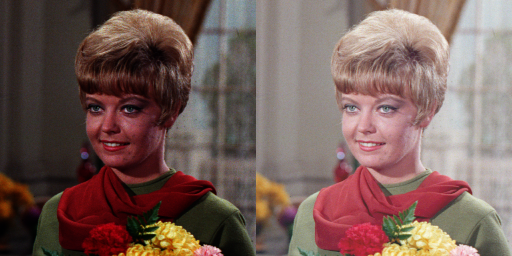

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

# Meminta input nilai Gamma dari pengguna
print('Gamma Correction pada citra')
print('----------------------------------')
try:
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, input bukan angka')

# Membaca gambar
image = cv2.imread('/content/drive/MyDrive/pcvk/female.tiff')

# Normalisasi citra dan terapkan rumus Gamma Correction
image_normalized = image / 255.0
gamma_corrected_image = 255.0 * (image_normalized ** (1 / gamma))
gamma_corrected_image = np.clip(gamma_corrected_image, 0, 255).astype(np.uint8)

# Menampilkan gambar hasil gabungan
cv2_imshow(np.hstack((image, gamma_corrected_image)))

### 2. Buat Simulasi Image Depth


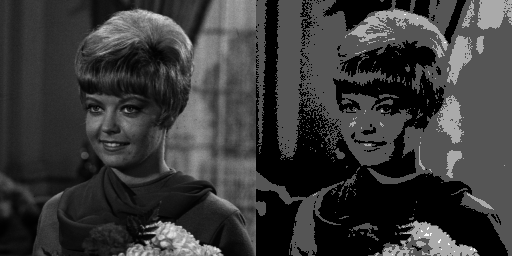

In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np

# Membaca gambar dalam format grayscale
img1 = cv2.imread('/content/drive/MyDrive/pcvk/female.tiff', cv2.IMREAD_GRAYSCALE)

# Salin gambar asli untuk diproses
img2 = img1.copy()

bit_depth = 2
# Menghitung level sesuai dengan bit depth
level = 255 / (2**bit_depth - 1)

# Inisialisasi gambar hasil depth reduction
depth_image = np.zeros(img2.shape, img2.dtype)

# Menghitung depth reduction untuk setiap piksel
for i in range(img2.shape[0]):
    for j in range(img2.shape[1]):
        depth_image[i, j] = round((img2[i, j] / level)) * level

# Gabungkan gambar asli dan hasil depth reduction secara horizontal
final_frame = np.hstack((img2, depth_image.astype(np.uint8)))

# Menampilkan gambar hasil gabungan
cv2_imshow(final_frame)

### 3. Buat modul Average Denoising

In [ ]:
import glob
imgNo3 =[]
for img in glob.glob('/content/drive/MyDrive/pcvk/noises/*.jpg'):
  n = cv.imread(img)
  imgNo3.append(n)

def PNSR(img1,img2):
  mse = np.mean((img1-img2)**2)
  if mse == 0:
    return 100
  max_pixel = 255.0
  psnr = 20*np.log10(max_pixel/np.sqrt(mse))
  return psnr

def averageDenoising(index):
  denoised_image = np.zeros_like(imgNo3[0], dtype=np.float32)
  for i in range(index):
    denoised_image += imgNo3[i].astype(np.float32)

  return denoised_image

5 citra di average

Nilai PSNR : 29.12 dB


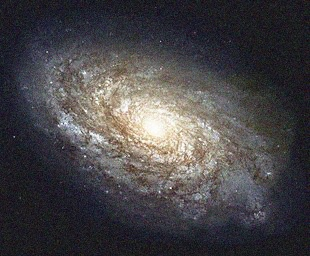

In [ ]:
denoised_image_5 = averageDenoising(5)
denoised_image_5 /= 5
denoised_image_5 = np.uint8(denoised_image_5)
print(f'Nilai PNSR : {PNSR(imgNo3[0],denoised_image_5)}')
print(f'Nilai PSNR : {PNSR(imgNo3[0], denoised_image_5):.2f} dB')
cv2_imshow(denoised_image_5)

10 citra di average

Nilai PSNR : 29.01 dB


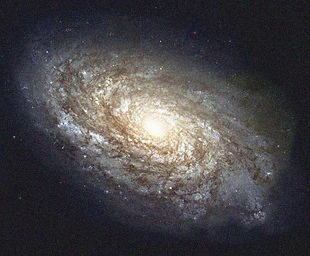

In [ ]:
denoised_image_10 = averageDenoising(10)
denoised_image_10 /= 10
denoised_image_10 = np.uint8(denoised_image_10)
print(f'Nilai PSNR : {PNSR(imgNo3[0], denoised_image_10):.2f} dB')
cv2_imshow(denoised_image_10)

20 citra di average

Nilai PSNR : 28.94 dB


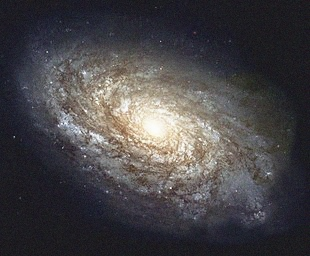

In [ ]:
denoised_image_20 = averageDenoising(20)
denoised_image_20 /= 20
denoised_image_20 = np.uint8(denoised_image_20)
print(f'Nilai PSNR : {PNSR(imgNo3[0], denoised_image_20):.2f} dB')
cv2_imshow(denoised_image_20)

40 citra di average

Nilai PSNR : 28.94 dB


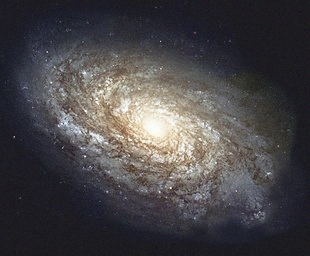

In [ ]:
denoised_image_40 = averageDenoising(40)
denoised_image_40 /= 40
denoised_image_40 = np.uint8(denoised_image_40)
print(f'Nilai PSNR : {PNSR(imgNo3[0], denoised_image_40):.2f} dB')
cv2_imshow(denoised_image_40)

80 citra di average

Nilai PSNR : 28.90 dB


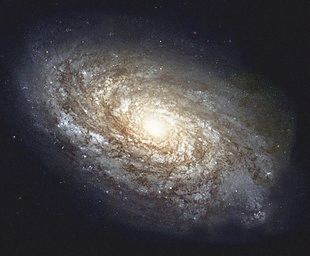

In [ ]:
denoised_image_80 = averageDenoising(80)
denoised_image_80 /= 80
denoised_image_80 = np.uint8(denoised_image_80)
print(f'Nilai PSNR : {PNSR(imgNo3[0], denoised_image_80):.2f} dB')
cv2_imshow(denoised_image_80)

100 citra di average

Nilai PSNR : 29.12 dB


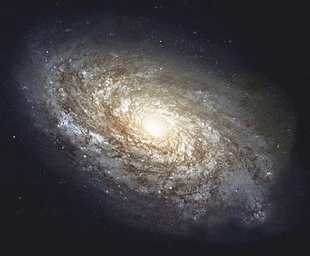

In [ ]:
denoised_image_100 = averageDenoising(100)
denoised_image_100 /= 100
denoised_image_100 = np.uint8(denoised_image_100)
print(f'Nilai PSNR : {PNSR(imgNo3[0], denoised_image_5):.2f} dB')
cv2_imshow(denoised_image_100)

Berdasarkan nilai PSNR yang diperoleh, penggabungan sekitar 20 gambar sudah cukup efektif untuk mengurangi noise tanpa mengorbankan kualitas. Menambahkan lebih banyak gambar hanya memberikan peningkatan yang minimal, dan bahkan bisa menurunkan kualitas jika variasi noise terlalu besar. Kesimpulannya, semakin banyak gambar yang digabungkan, kualitas kemiripannya dengan gambar asli cenderung menurun, yang dapat terlihat secara kasat mata.

### 4. Buat image masking untuk image berikut.

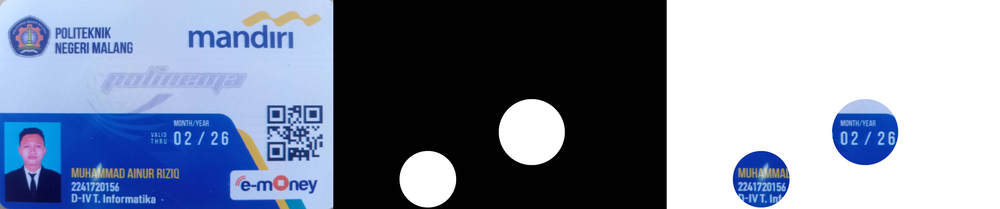

In [ ]:
# Membaca gambar
ktm = cv2.imread('/content/drive/MyDrive/pcvk/ktm/foto1.jpg')

# Membuat mask
mask = np.zeros(ktm.shape, ktm.dtype)

# Membuat lingkaran untuk crop
cv2.circle(mask, (2100, 1400), radius=350, color=(255, 255, 255), thickness=-1)
cv2.circle(mask, (1000, 1900), radius=300, color=(255, 255, 255), thickness=-1)

# Menggunakan AND operator
croped_and = cv2.bitwise_and(ktm, mask)
croped_and[np.all(mask == 0, axis=-1)] = [255, 255, 255]

# Menggabungkan gambar hasil AND operator
frame_and = cv2.hconcat((ktm, mask, croped_and))
cv2_imshow(frame_and)

### 5. Lakukan percobaan menggunakan operator lain

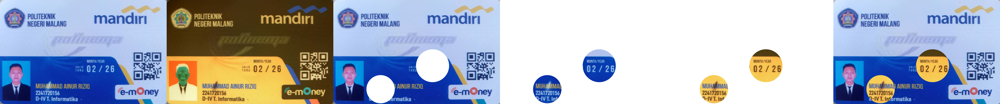

In [35]:
# Membaca gambar
ktm = cv2.imread('/content/drive/MyDrive/pcvk/ktm/foto1.jpg')

# Membuat mask
mask = np.zeros(ktm.shape, ktm.dtype)

# Membuat lingkaran untuk crop
cv2.circle(mask, (2100, 1400), radius=350, color=(255, 255, 255), thickness=-1)
cv2.circle(mask, (1000, 1900), radius=300, color=(255, 255, 255), thickness=-1)

# Menggunakan AND operator
croped_and = cv2.bitwise_and(ktm, mask)
croped_and[np.all(mask == 0, axis=-1)] = [255, 255, 255]

# Menggunakan OR operator
croped_or = cv2.bitwise_or(ktm, mask)

# Menggunakan XOR operator
croped_xor = cv2.bitwise_xor(ktm, mask)

# Menggunakan NOT operator
croped_not = cv2.bitwise_not(ktm)

# Menggunakan NAND operator (kombinasi NOT dan AND)
croped_nand = cv2.bitwise_not(cv2.bitwise_and(ktm, mask))

# Menggabungkan gambar hasil operasi AND, OR, XOR, NOT, dan NAND
frame_combined = cv2.hconcat((ktm, croped_not, croped_or,croped_and, croped_nand, croped_xor))

# Menampilkan hasil
cv2_imshow(frame_combined)